<a href="https://colab.research.google.com/github/safarie1103/DSC680/blob/main/Project1-stock-market-technical-indicators_and_Prediction/Code/stock-market-technical-indicators-visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stock Market Visualization

In [ ]:
# Import Modules
import os
import sys

import json
from pathlib import Path
import numpy as np
import pandas as pd
import os
import random
import copy
import matplotlib.pyplot as plt
import pandas

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
data_dir = Path('/content/drive/MyDrive/DataSets/')

Mounted at /content/drive


In [ ]:

data_dir = Path('D:/GitHub/dsc650/ExternalResources/stock-market-technical-indicators-visualization/data/')

## Read the data from Stock folder

### Check how much data is available? 

In [ ]:
from subprocess import check_output
print(check_output(["dir", ""]).decode("utf8"))

In [ ]:
 for root, dirs, files in os.walk(data_dir.joinpath('kv')):

In [ ]:
os.chdir(data_dir.joinpath('Stocks'))
list = os.listdir()
number_files = len(list)
print(number_files)

7195


In [ ]:
os.chdir(data_dir.joinpath('ETFs'))
list = os.listdir()
number_files = len(list)
print(number_files)

1344


### Choose 8 random stock data for analysis

In [ ]:
#filenames = [x for x in os.listdir("./Stocks/") if x.endswith('.txt') and os.path.getsize(x) > 0]
os.chdir(data_dir.joinpath('Stocks'))
filenames = random.sample([x for x in os.listdir() if x.endswith('.txt') 
                           and os.path.getsize(os.path.join('',x)) > 0], 8)
print(filenames)

['emtl.us.txt', 'renx.us.txt', 'fhn_a.us.txt', 'dcph.us.txt', 'agn.us.txt', 'liqt.us.txt', 'aeti.us.txt', 'ggn_b.us.txt']


### Read data into dataframes

In [ ]:
data = []
for filename in filenames:
    print(os.path.join('',filename))
    df = pd.read_csv(os.path.join('',filename), sep=',')
    label, _, _ = filename.split(sep='.')
    df['Label'] = label
    df['Date'] = pd.to_datetime(df['Date'])

    data.append(df)

emtl.us.txt
renx.us.txt
fhn_a.us.txt
dcph.us.txt
agn.us.txt
liqt.us.txt
aeti.us.txt
ggn_b.us.txt


In [ ]:
data[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2016-04-20,47.595,47.595,47.585,47.585,843,0,emtl
1,2016-04-21,47.633,47.643,47.595,47.595,1583,0,emtl
2,2016-04-22,47.643,47.643,47.643,47.643,166,0,emtl
3,2016-04-25,47.643,47.643,47.643,47.643,0,0,emtl
4,2016-04-26,47.643,47.643,47.643,47.643,0,0,emtl


In [ ]:
data[1].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2005-02-25,8.2462,8.3998,8.2195,8.3678,200583,0,renx
1,2005-02-28,8.1855,8.2223,8.1164,8.1508,111905,0,renx
2,2005-03-01,8.1562,8.2595,8.1562,8.2223,134814,0,renx
3,2005-03-02,8.0690,8.1802,8.0611,8.1508,115506,0,renx
4,2005-03-03,8.1774,8.2724,8.1774,8.1883,132521,0,renx


In [ ]:
print(len(data))

8


## Add various Technical Indicators in the dataframe

There are many types of Technical Indicators. 
The Technical Indicators we are considering are:
- RSI, Volume (plain), Bollinger Bands, Aroon, Price Volume Trend, acceleration bands
- Stochastic, Chaikin Money Flow, Parabolic SAR, Rate of Change, Volume weighted average Price, momentum
- Commodity Channel Index, On Balance Volume, Keltner Channels, Triple Exponential Moving Average, Normalized Averager True Range ,directional movement indicators
- MACD, Money flowindex , Ichimoku, William %R, Volume MINMAX, adaptive moving average

In [ ]:
TechIndicator = copy.deepcopy(data)

### Calculation of Relative Strength Index (RSI)

Benefit of day to day price

In [ ]:
# Relative Strength Index
# Avg(PriceUp)/(Avg(PriceUP)+Avg(PriceDown)*100
# Where: PriceUp(t)=1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)>0};
#        PriceDown(t)=-1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)<0};

def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)


In [ ]:
# Add Momentum_1D column for all 15 stocks.
# Momentum_1D = P(t) - P(t-1)
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum_1D'] = (TechIndicator[stock]['Close']-TechIndicator[stock]['Close'].shift(1)).fillna(0)
    TechIndicator[stock]['RSI_14D'] = TechIndicator[stock]['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
TechIndicator[1].tail(5)

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
3196,2017-11-06,22.25,22.37,22.24,22.35,43188,0,renx,-0.03,57.692308
3197,2017-11-07,22.27,22.27,22.19,22.27,53056,0,renx,-0.08,58.536585
3198,2017-11-08,22.19,22.37,22.17,22.34,26417,0,renx,0.07,58.937198
3199,2017-11-09,22.28,22.39,22.24,22.38,43122,0,renx,0.04,54.154728
3200,2017-11-10,22.42,22.42,22.31,22.38,24642,0,renx,0.00,51.894563


In [ ]:
TechIndicator[1].head(5)

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
0,2005-02-25,8.2462,8.3998,8.2195,8.3678,200583,0,renx,0.0000,0.0
1,2005-02-28,8.1855,8.2223,8.1164,8.1508,111905,0,renx,-0.2170,0.0
2,2005-03-01,8.1562,8.2595,8.1562,8.2223,134814,0,renx,0.0715,0.0
3,2005-03-02,8.0690,8.1802,8.0611,8.1508,115506,0,renx,-0.0715,0.0
4,2005-03-03,8.1774,8.2724,8.1774,8.1883,132521,0,renx,0.0375,0.0


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
import numpy as np

In [ ]:
TechIndicator[0]["Open"]

0      47.5950
1      47.6330
2      47.6430
3      47.6430
4      47.6430
        ...   
391    51.1500
392    51.1200
393    51.0500
394    50.9800
395    50.8197
Name: Open, Length: 396, dtype: float64

In [ ]:
TechIndicator[0]["Volume"]

0       314114
1       285207
2       368185
3       376849
4       397836
         ...  
3196    177558
3197    215886
3198    122016
3199    130483
3200     92534
Name: Volume, Length: 3201, dtype: int64

In [ ]:
fig = px.scatter(data_frame=TechIndicator[0],
           x='Volume', 
           log_x=True,
           title='Volume_plain',
           size='Volume',           
           animation_frame=TechIndicator[0].index,
           height=600,
           size_max=100
           )

In [ ]:
fig.show()

In [ ]:
### Calculation of Volume (Plain)m

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Volume_plain'] = TechIndicator[stock]['Volume'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain
391,2017-11-06,51.1500,52.27,50.9971,51.21,11759,0,emtl,0.15,58.131632,11759
392,2017-11-07,51.1200,51.12,50.9973,51.09,64268,0,emtl,-0.12,54.322368,64268
393,2017-11-08,51.0500,51.06,50.8900,51.05,13023,0,emtl,-0.04,53.491573,13023
394,2017-11-09,50.9800,51.00,50.8547,51.00,5638,0,emtl,-0.05,53.085633,5638
395,2017-11-10,50.8197,50.98,50.7700,50.98,7721,0,emtl,-0.02,59.528188,7721


### Calculation of Bollinger Bands

In [ ]:
def bbands(price, length=30, numsd=2):
    """ returns average, upper band, and lower band"""
    #ave = pd.stats.moments.rolling_mean(price,length)
    ave = price.rolling(window = length, center = False).mean()
    #sd = pd.stats.moments.rolling_std(price,length)
    sd = price.rolling(window = length, center = False).std()
    upband = ave + (sd*numsd)
    dnband = ave - (sd*numsd)
    return np.round(ave,3), np.round(upband,3), np.round(dnband,3)

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['BB_Middle_Band'], TechIndicator[stock]['BB_Upper_Band'], TechIndicator[stock]['BB_Lower_Band'] = bbands(TechIndicator[stock]['Close'], length=20, numsd=1)
    TechIndicator[stock]['BB_Middle_Band'] = TechIndicator[stock]['BB_Middle_Band'].fillna(0)
    TechIndicator[stock]['BB_Upper_Band'] = TechIndicator[stock]['BB_Upper_Band'].fillna(0)
    TechIndicator[stock]['BB_Lower_Band'] = TechIndicator[stock]['BB_Lower_Band'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band
391,2017-11-06,51.1500,52.27,50.9971,51.21,11759,0,emtl,0.15,58.131632,11759,51.136,51.223,51.049
392,2017-11-07,51.1200,51.12,50.9973,51.09,64268,0,emtl,-0.12,54.322368,64268,51.146,51.214,51.077
393,2017-11-08,51.0500,51.06,50.8900,51.05,13023,0,emtl,-0.04,53.491573,13023,51.142,51.214,51.070
394,2017-11-09,50.9800,51.00,50.8547,51.00,5638,0,emtl,-0.05,53.085633,5638,51.136,51.215,51.058
395,2017-11-10,50.8197,50.98,50.7700,50.98,7721,0,emtl,-0.02,59.528188,7721,51.126,51.211,51.041


### Calculation of Aroon Oscillator

how strong is the trend

In [ ]:
def aroon(df, tf=25):
    aroonup = []
    aroondown = []
    x = tf
    while x< len(df['Date']):
        aroon_up = ((df['High'][x-tf:x].tolist().index(max(df['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((df['Low'][x-tf:x].tolist().index(min(df['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x+=1
    return aroonup, aroondown

In [ ]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 25
    up, down = aroon(TechIndicator[stock])
    aroon_list = [x - y for x, y in zip(up,down)]
    if len(aroon_list)==0:
        aroon_list = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Aroon_Oscillator'] = aroon_list
    else:
        TechIndicator[stock]['Aroon_Oscillator'] = listofzeros+aroon_list


### Calculation of Price Volume Trend

PVT = [((CurrentClose - PreviousClose) / PreviousClose) x Volume] + PreviousPVT

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]["PVT"] = (TechIndicator[stock]['Momentum_1D']/ TechIndicator[stock]['Close'].shift(1))*TechIndicator[stock]['Volume']
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"]+TechIndicator[stock]["PVT"].shift(1)
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT
391,2017-11-06,51.1500,52.27,50.9971,51.21,11759,0,emtl,0.15,58.131632,11759,51.136,51.223,51.049,44.0,27.629697
392,2017-11-07,51.1200,51.12,50.9973,51.09,64268,0,emtl,-0.12,54.322368,64268,51.146,51.214,51.077,96.0,-116.054058
393,2017-11-08,51.0500,51.06,50.8900,51.05,13023,0,emtl,-0.04,53.491573,13023,51.142,51.214,51.070,84.0,-160.794836
394,2017-11-09,50.9800,51.00,50.8547,51.00,5638,0,emtl,-0.05,53.085633,5638,51.136,51.215,51.058,84.0,-15.718162
395,2017-11-10,50.8197,50.98,50.7700,50.98,7721,0,emtl,-0.02,59.528188,7721,51.126,51.211,51.041,84.0,-8.549880


### Calculation of Acceleration Bands

lower envelope bands around a simple moving average. 

In [ ]:
def abands(df):
    #df['AB_Middle_Band'] = pd.rolling_mean(df['Close'], 20)
    df['AB_Middle_Band'] = df['Close'].rolling(window = 20, center=False).mean()
    # High * ( 1 + 4 * (High - Low) / (High + Low))
    df['aupband'] = df['High'] * (1 + 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Upper_Band'] = df['aupband'].rolling(window=20, center=False).mean()
    # Low *(1 - 4 * (High - Low)/ (High + Low))
    df['adownband'] = df['Low'] * (1 - 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Lower_Band'] = df['adownband'].rolling(window=20, center=False).mean()

In [ ]:
for stock in range(len(TechIndicator)):
    abands(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band
391,2017-11-06,51.1500,52.27,50.9971,51.21,11759,0,emtl,0.15,58.131632,...,51.136,51.223,51.049,44.0,27.629697,51.13624,54.847180,51.526544,48.482680,50.777319
392,2017-11-07,51.1200,51.12,50.9973,51.09,64268,0,emtl,-0.12,54.322368,...,51.146,51.214,51.077,96.0,-116.054058,51.14564,51.365695,51.518336,50.752195,50.790686
393,2017-11-08,51.0500,51.06,50.8900,51.05,13023,0,emtl,-0.04,53.491573,...,51.142,51.214,51.070,84.0,-160.794836,51.14209,51.400567,51.523909,50.550567,50.773509
394,2017-11-09,50.9800,51.00,50.8547,51.00,5638,0,emtl,-0.05,53.085633,...,51.136,51.215,51.058,84.0,-15.718162,51.13629,51.291015,51.532659,50.564515,50.745934
395,2017-11-10,50.8197,50.98,50.7700,50.98,7721,0,emtl,-0.02,59.528188,...,51.126,51.211,51.041,84.0,-8.549880,51.12624,51.400867,51.530141,50.350867,50.718416


## Drop unwanted columns

In [ ]:
columns2Drop = ['Momentum_1D', 'aupband', 'adownband']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
0,2014-09-30,22.540,22.549,22.522,22.549,2275,0,heem,0.0,2275,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,2014-10-01,22.361,22.361,22.345,22.345,321,0,heem,0.0,321,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,2014-10-02,22.044,22.053,22.015,22.053,535,0,heem,0.0,535,0.0,0.0,0.0,0.0,-9.895349,0.0,0.0,0.0
3,2014-10-03,22.438,22.474,22.390,22.464,25532,0,heem,0.0,25532,0.0,0.0,0.0,0.0,468.846572,0.0,0.0,0.0
4,2014-10-06,22.924,22.924,22.784,22.821,17552,0,heem,0.0,17552,0.0,0.0,0.0,0.0,754.775879,0.0,0.0,0.0


### Calculation of Stochastic Oscillator (%K and %D)

price as a percentage between 0 and 10

In [ ]:
def STOK(df, n):
    df['STOK'] = ((df['Close'] - df['Low'].rolling(window=n, center=False).mean()) / (df['High'].rolling(window=n, center=False).max() - df['Low'].rolling(window=n, center=False).min())) * 100
    df['STOD'] = df['STOK'].rolling(window = 3, center=False).mean()

In [ ]:
for stock in range(len(TechIndicator)):
    STOK(TechIndicator[stock], 4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band,Chaikin_MF,STOK,STOD
391,2017-11-06,51.1500,52.27,50.9971,51.21,11759,0,emtl,0.15,58.131632,...,44.0,27.629697,51.13624,54.847180,51.526544,48.482680,50.777319,0.0,14.362191,9.931803
392,2017-11-07,51.1200,51.12,50.9973,51.09,64268,0,emtl,-0.12,54.322368,...,96.0,-116.054058,51.14564,51.365695,51.518336,50.752195,50.790686,0.0,7.166078,8.597091
393,2017-11-08,51.0500,51.06,50.8900,51.05,13023,0,emtl,-0.04,53.491573,...,84.0,-160.794836,51.14209,51.400567,51.523909,50.550567,50.773509,0.0,8.137809,9.888693
394,2017-11-09,50.9800,51.00,50.8547,51.00,5638,0,emtl,-0.05,53.085633,...,84.0,-15.718162,51.13629,51.291015,51.532659,50.564515,50.745934,0.0,4.608564,6.637483
395,2017-11-10,50.8197,50.98,50.7700,50.98,7721,0,emtl,-0.02,59.528188,...,84.0,-8.549880,51.12624,51.400867,51.530141,50.350867,50.718416,0.0,29.142857,13.963077


### Calculation of Chaikin Money Flow

เครื่องมือการวิเคราะห์ปริมาณการซื้อขายในการเทรดในช่วง 20 วันย้อนหลัง ที่นำมาสร้างเป็น Oscillator แกว่งตัวระหว่างเส้น 0 เพื่อเทียบแรงซื้อแรงขายที่เกิดขึ้น

1. Money Flow Multiplier = [(Close  – Low) – (High – Close)] /(High – Low) 
2. Money Flow Volume = Money Flow Multiplier x Volume for the Period
3. 20-period CMF = 20-period Sum of Money Flow Volume / 20 period Sum of Volume

สังเกตในส่วนของ Money Flow Multiplier มันจะให้ค่าเป็นบวกก็ต่อเมื่อ ราคาปิด อยู่สูงกว่าครึ่งของช่วง High-Low ตรงกันข้ามจะให้ค่าติดลบก็ต่อเมื่อ ราคาปิด อยู่ต่ำกว่าครึ่งของช่วง High-Low และเมื่อ Multiplier = +1 เมื่อราคาปิดที่บริเวณ High ส่วน Multiplier = -1 เมื่อราคาปิดที่บริเวณ Low 

In [ ]:
def CMFlow(df, tf):
    CHMF = []
    MFMs = []
    MFVs = []
    x = tf
    
    while x < len(df['Date']):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        
        MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
        MFV = MFM*PeriodVolume
        
        MFMs.append(MFM)
        MFVs.append(MFV)
        x+=1
    
    y = tf
    while y < len(MFVs):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        consider = MFVs[y-tf:y]
        tfsMFV = 0
        
        for eachMFV in consider:
            tfsMFV += eachMFV
        
        tfsCMF = tfsMFV/PeriodVolume
        CHMF.append(tfsCMF)
        y+=1
    return CHMF

In [ ]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 40
    CHMF = CMFlow(TechIndicator[stock], 20)
    if len(CHMF)==0:
        CHMF = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Chaikin_MF'] = CHMF
    else:
        TechIndicator[stock]['Chaikin_MF'] = listofzeros+CHMF
TechIndicator[0].tail()

<ipython-input-32-9d42af651c40>:13: RuntimeWarning:

invalid value encountered in double_scalars



,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band,Chaikin_MF,STOK,STOD
391,2017-11-06,51.1500,52.27,50.9971,51.21,11759,0,emtl,0.15,58.131632,...,44.0,27.629697,51.13624,54.847180,51.526544,48.482680,50.777319,NaN,14.362191,9.931803
392,2017-11-07,51.1200,51.12,50.9973,51.09,64268,0,emtl,-0.12,54.322368,...,96.0,-116.054058,51.14564,51.365695,51.518336,50.752195,50.790686,NaN,7.166078,8.597091
393,2017-11-08,51.0500,51.06,50.8900,51.05,13023,0,emtl,-0.04,53.491573,...,84.0,-160.794836,51.14209,51.400567,51.523909,50.550567,50.773509,NaN,8.137809,9.888693
394,2017-11-09,50.9800,51.00,50.8547,51.00,5638,0,emtl,-0.05,53.085633,...,84.0,-15.718162,51.13629,51.291015,51.532659,50.564515,50.745934,NaN,4.608564,6.637483
395,2017-11-10,50.8197,50.98,50.7700,50.98,7721,0,emtl,-0.02,59.528188,...,84.0,-8.549880,51.12624,51.400867,51.530141,50.350867,50.718416,NaN,29.142857,13.963077


### Calculation of Parabolic SAR

In [ ]:
def psar(df, iaf = 0.02, maxaf = 0.2):
    length = len(df)
    dates = (df['Date'])
    high = (df['High'])
    low = (df['Low'])
    close = (df['Close'])
    psar = df['Close'][0:len(df['Close'])]
    psarbull = [None] * length
    psarbear = [None] * length
    bull = True
    af = iaf
    ep = df['Low'][0]
    hp = df['High'][0]
    lp = df['Low'][0]
    for i in range(2,length):
        if bull:
            psar[i] = psar[i - 1] + af * (hp - psar[i - 1])
        else:
            psar[i] = psar[i - 1] + af * (lp - psar[i - 1])
        reverse = False
        if bull:
            if df['Low'][i] < psar[i]:
                bull = False
                reverse = True
                psar[i] = hp
                lp = df['Low'][i]
                af = iaf
        else:
            if df['High'][i] > psar[i]:
                bull = True
                reverse = True
                psar[i] = lp
                hp = df['High'][i]
                af = iaf
        if not reverse:
            if bull:
                if df['High'][i] > hp:
                    hp = df['High'][i]
                    af = min(af + iaf, maxaf)
                if df['Low'][i - 1] < psar[i]:
                    psar[i] = df['Low'][i - 1]
                if df['Low'][i - 2] < psar[i]:
                    psar[i] = df['Low'][i - 2]
            else:
                if df['Low'][i] < lp:
                    lp = df['Low'][i]
                    af = min(af + iaf, maxaf)
                if df['High'][i - 1] > psar[i]:
                    psar[i] = df['High'][i - 1]
                if df['High'][i - 2] > psar[i]:
                    psar[i] = df['High'][i - 2]
        if bull:
            psarbull[i] = psar[i]
        else:
            psarbear[i] = psar[i]
    #return {"dates":dates, "high":high, "low":low, "close":close, "psar":psar, "psarbear":psarbear, "psarbull":psarbull}
    #return psar, psarbear, psarbull
    df['psar'] = psar
    #df['psarbear'] = psarbear
    #df['psarbull'] = psarbull

In [ ]:
for stock in range(len(TechIndicator)):
    psar(TechIndicator[stock])

TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band,Chaikin_MF,STOK,STOD,psar
391,2017-11-06,51.1500,52.27,50.9971,50.855000,11759,0,emtl,0.15,58.131632,...,27.629697,51.13624,54.847180,51.526544,48.482680,50.777319,NaN,14.362191,9.931803,50.855000
392,2017-11-07,51.1200,51.12,50.9973,50.855000,64268,0,emtl,-0.12,54.322368,...,-116.054058,51.14564,51.365695,51.518336,50.752195,50.790686,NaN,7.166078,8.597091,50.855000
393,2017-11-08,51.0500,51.06,50.8900,50.883300,13023,0,emtl,-0.04,53.491573,...,-160.794836,51.14209,51.400567,51.523909,50.550567,50.773509,NaN,8.137809,9.888693,50.883300
394,2017-11-09,50.9800,51.00,50.8547,52.270000,5638,0,emtl,-0.05,53.085633,...,-15.718162,51.13629,51.291015,51.532659,50.564515,50.745934,NaN,4.608564,6.637483,52.270000
395,2017-11-10,50.8197,50.98,50.7700,52.241694,7721,0,emtl,-0.02,59.528188,...,-8.549880,51.12624,51.400867,51.530141,50.350867,50.718416,NaN,29.142857,13.963077,52.241694


### Calculation of Price Rate of Change

In [ ]:
# ROC = [(Close - Close n periods ago) / (Close n periods ago)] * 100
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['ROC'] = ((TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(12))/(TechIndicator[stock]['Close'].shift(12)))*100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band,Chaikin_MF,STOK,STOD,psar,ROC
391,2017-11-06,51.1500,52.27,50.9971,50.855000,11759,0,emtl,0.15,58.131632,...,51.13624,54.847180,51.526544,48.482680,50.777319,0.0,14.362191,9.931803,50.855000,-0.045735
392,2017-11-07,51.1200,51.12,50.9973,50.855000,64268,0,emtl,-0.12,54.322368,...,51.14564,51.365695,51.518336,50.752195,50.790686,0.0,7.166078,8.597091,50.855000,-0.089651
393,2017-11-08,51.0500,51.06,50.8900,50.883300,13023,0,emtl,-0.04,53.491573,...,51.14209,51.400567,51.523909,50.550567,50.773509,0.0,8.137809,9.888693,50.883300,-0.075322
394,2017-11-09,50.9800,51.00,50.8547,52.270000,5638,0,emtl,-0.05,53.085633,...,51.13629,51.291015,51.532659,50.564515,50.745934,0.0,4.608564,6.637483,52.270000,2.608063
395,2017-11-10,50.8197,50.98,50.7700,52.241694,7721,0,emtl,-0.02,59.528188,...,51.12624,51.400867,51.530141,50.350867,50.718416,0.0,29.142857,13.963077,52.241694,2.515116


### Calculation of Volume Weighted Average Price

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['VWAP'] = np.cumsum(TechIndicator[stock]['Volume'] * (TechIndicator[stock]['High'] + TechIndicator[stock]['Low'])/2) / np.cumsum(TechIndicator[stock]['Volume'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,aupband,AB_Upper_Band,adownband,AB_Lower_Band,Chaikin_MF,STOK,STOD,psar,ROC,VWAP
391,2017-11-06,51.1500,52.27,50.9971,50.855000,11759,0,emtl,0.15,58.131632,...,54.847180,51.526544,48.482680,50.777319,0.0,14.362191,9.931803,50.855000,-0.045735,49.880491
392,2017-11-07,51.1200,51.12,50.9973,50.855000,64268,0,emtl,-0.12,54.322368,...,51.365695,51.518336,50.752195,50.790686,0.0,7.166078,8.597091,50.855000,-0.089651,49.920084
393,2017-11-08,51.0500,51.06,50.8900,50.883300,13023,0,emtl,-0.04,53.491573,...,51.400567,51.523909,50.550567,50.773509,0.0,8.137809,9.888693,50.883300,-0.075322,49.927219
394,2017-11-09,50.9800,51.00,50.8547,52.270000,5638,0,emtl,-0.05,53.085633,...,51.291015,51.532659,50.564515,50.745934,0.0,4.608564,6.637483,52.270000,2.608063,49.930139
395,2017-11-10,50.8197,50.98,50.7700,52.241694,7721,0,emtl,-0.02,59.528188,...,51.400867,51.530141,50.350867,50.718416,0.0,29.142857,13.963077,52.241694,2.515116,49.933902


### Calculation of Momentum 

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum'] = TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,AB_Upper_Band,adownband,AB_Lower_Band,Chaikin_MF,STOK,STOD,psar,ROC,VWAP,Momentum
391,2017-11-06,51.1500,52.27,50.9971,50.855000,11759,0,emtl,0.15,58.131632,...,51.526544,48.482680,50.777319,0.0,14.362191,9.931803,50.855000,-0.045735,49.880491,-0.147840
392,2017-11-07,51.1200,51.12,50.9973,50.855000,64268,0,emtl,-0.12,54.322368,...,51.518336,50.752195,50.790686,0.0,7.166078,8.597091,50.855000,-0.089651,49.920084,-0.162730
393,2017-11-08,51.0500,51.06,50.8900,50.883300,13023,0,emtl,-0.04,53.491573,...,51.523909,50.550567,50.773509,0.0,8.137809,9.888693,50.883300,-0.075322,49.927219,-0.148426
394,2017-11-09,50.9800,51.00,50.8547,52.270000,5638,0,emtl,-0.05,53.085633,...,51.532659,50.564515,50.745934,0.0,4.608564,6.637483,52.270000,2.608063,49.930139,1.019000
395,2017-11-10,50.8197,50.98,50.7700,52.241694,7721,0,emtl,-0.02,59.528188,...,51.530141,50.350867,50.718416,0.0,29.142857,13.963077,52.241694,2.515116,49.933902,1.386694


### Calculation of Commodity Channel Index

overbought or oversold.

In [ ]:
def CCI(df, n, constant):
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    CCI = pd.Series((TP - TP.rolling(window=n, center=False).mean()) / (constant * TP.rolling(window=n, center=False).std())) #, name = 'CCI_' + str(n))
    return CCI

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['CCI'] = CCI(TechIndicator[stock], 20, 0.015)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,adownband,AB_Lower_Band,Chaikin_MF,STOK,STOD,psar,ROC,VWAP,Momentum,CCI
391,2017-11-06,51.1500,52.27,50.9971,50.855000,11759,0,emtl,0.15,58.131632,...,48.482680,50.777319,0.0,14.362191,9.931803,50.855000,-0.045735,49.880491,-0.147840,243.140608
392,2017-11-07,51.1200,51.12,50.9973,50.855000,64268,0,emtl,-0.12,54.322368,...,50.752195,50.790686,0.0,7.166078,8.597091,50.855000,-0.089651,49.920084,-0.162730,-68.909894
393,2017-11-08,51.0500,51.06,50.8900,50.883300,13023,0,emtl,-0.04,53.491573,...,50.550567,50.773509,0.0,8.137809,9.888693,50.883300,-0.075322,49.927219,-0.148426,-100.443991
394,2017-11-09,50.9800,51.00,50.8547,52.270000,5638,0,emtl,-0.05,53.085633,...,50.564515,50.745934,0.0,4.608564,6.637483,52.270000,2.608063,49.930139,1.019000,174.865023
395,2017-11-10,50.8197,50.98,50.7700,52.241694,7721,0,emtl,-0.02,59.528188,...,50.350867,50.718416,0.0,29.142857,13.963077,52.241694,2.515116,49.933902,1.386694,125.038181


Deviation Detect
https://dspyt.com/advanced-realized-volatility-and-quarticity/

### Calculation of On Balance Volume

If the closing price is above the prior close price then: 
Current OBV = Previous OBV + Current Volume

If the closing price is below the prior close price then: 
Current OBV = Previous OBV  -  Current Volume

If the closing prices equals the prior close price then:
Current OBV = Previous OBV (no change)

In [ ]:
for stock in range(len(TechIndicator)):
    new = (TechIndicator[stock]['Volume'] * (~TechIndicator[stock]['Close'].diff().le(0) * 2 -1)).cumsum()
    TechIndicator[stock]['OBV'] = new
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,AB_Lower_Band,Chaikin_MF,STOK,STOD,psar,ROC,VWAP,Momentum,CCI,OBV
985,2017-11-06,0.3333,0.3494,0.3200,0.269407,19419,0,liqt,0.0049,39.603960,...,0.252927,-8.402402,20.916667,24.671740,0.269407,-32.111172,1.126096,-0.069966,-56.554877,-22009891
986,2017-11-07,0.3150,0.3400,0.2898,0.273030,112047,0,liqt,0.0150,41.040462,...,0.246743,-7.075618,42.877493,28.479006,0.273030,-30.175708,1.125102,0.013030,-88.895761,-21897844
987,2017-11-08,0.3300,0.3450,0.3298,0.276509,26300,0,liqt,-0.0102,42.031731,...,0.245693,-4.281692,25.083893,29.626017,0.276509,-28.284389,1.124875,0.014809,-27.797944,-21871544
988,2017-11-09,0.3198,0.3450,0.2750,0.360000,58604,0,liqt,-0.0058,48.563611,...,0.237180,-3.325710,27.352151,31.771179,0.360000,-5.370167,1.124353,0.094368,12.815267,-21812940
989,2017-11-10,0.3150,0.3150,0.3050,0.358300,20052,0,liqt,-0.0140,49.870862,...,0.234529,-1.091469,14.428571,22.288205,0.358300,-3.369873,1.124174,0.088893,16.545861,-21832992


### Calcualtion of Keltner Channels

In [ ]:
#Keltner Channel  
def KELCH(df, n):  
    KelChM = pd.Series(((df['High'] + df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChM_' + str(n))  
    KelChU = pd.Series(((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChU_' + str(n))  
    KelChD = pd.Series(((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChD_' + str(n))    
    return KelChM, KelChD, KelChU

In [ ]:
for stock in range(len(TechIndicator)):
    KelchM, KelchD, KelchU = KELCH(TechIndicator[stock], 14)
    TechIndicator[stock]['Kelch_Upper'] = KelchU
    TechIndicator[stock]['Kelch_Middle'] = KelchM
    TechIndicator[stock]['Kelch_Down'] = KelchD
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,STOD,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down
985,2017-11-06,0.3333,0.3494,0.3200,0.269407,19419,0,liqt,0.0049,39.603960,...,24.671740,0.269407,-32.111172,1.126096,-0.069966,-56.554877,-22009891,0.349843,0.319593,0.289343
986,2017-11-07,0.3150,0.3400,0.2898,0.273030,112047,0,liqt,0.0150,41.040462,...,28.479006,0.273030,-30.175708,1.125102,0.013030,-88.895761,-21897844,0.349052,0.316745,0.284437
987,2017-11-08,0.3300,0.3450,0.3298,0.276509,26300,0,liqt,-0.0102,42.031731,...,29.626017,0.276509,-28.284389,1.124875,0.014809,-27.797944,-21871544,0.347149,0.315184,0.283220
988,2017-11-09,0.3198,0.3450,0.2750,0.360000,58604,0,liqt,-0.0058,48.563611,...,31.771179,0.360000,-5.370167,1.124353,0.094368,12.815267,-21812940,0.348134,0.313984,0.279834
989,2017-11-10,0.3150,0.3150,0.3050,0.358300,20052,0,liqt,-0.0140,49.870862,...,22.288205,0.358300,-3.369873,1.124174,0.088893,16.545861,-21832992,0.345609,0.313044,0.280480


### Calculation of Triple Exponential Moving Average

Triple Exponential MA Formula:

T-EMA = (3*EMA – 3*EMA(EMA)) + EMA(EMA(EMA))

Where:

EMA = EMA(1) + α * (Close – EMA(1))

α = 2 / (N + 1)

N = The smoothing period.

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['EMA'] = TechIndicator[stock]['Close'].ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()
    
    TechIndicator[stock] = TechIndicator[stock].fillna(0)

for stock in range(len(TechIndicator)):
    TechIndicator[stock]['TEMA'] = (3 * TechIndicator[stock]['EMA'] - 3 * TechIndicator[stock]['EMA'] * TechIndicator[stock]['EMA']) + (TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA'])
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA
985,2017-11-06,0.3333,0.3494,0.3200,0.269407,19419,0,liqt,0.0049,39.603960,...,-32.111172,1.126096,-0.069966,-56.554877,-22009891,0.349843,0.319593,0.289343,0.271743,0.613763
986,2017-11-07,0.3150,0.3400,0.2898,0.273030,112047,0,liqt,0.0150,41.040462,...,-30.175708,1.125102,0.013030,-88.895761,-21897844,0.349052,0.316745,0.284437,0.272387,0.614786
987,2017-11-08,0.3300,0.3450,0.3298,0.276509,26300,0,liqt,-0.0102,42.031731,...,-28.284389,1.124875,0.014809,-27.797944,-21871544,0.347149,0.315184,0.283220,0.274448,0.618051
988,2017-11-09,0.3198,0.3450,0.2750,0.360000,58604,0,liqt,-0.0058,48.563611,...,-5.370167,1.124353,0.094368,12.815267,-21812940,0.348134,0.313984,0.279834,0.317224,0.681701
989,2017-11-10,0.3150,0.3150,0.3050,0.358300,20052,0,liqt,-0.0140,49.870862,...,-3.369873,1.124174,0.088893,16.545861,-21832992,0.345609,0.313044,0.280480,0.337762,0.709569


### Calculation of Normalized Average True Range

True Range = Highest of (HIgh - low, abs(High - previous close), abs(low - previous close))

Average True Range = 14 day MA of True Range

Normalized Average True Range = ATR / Close * 100

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['HL'] = TechIndicator[stock]['High'] - TechIndicator[stock]['Low']
    TechIndicator[stock]['absHC'] = abs(TechIndicator[stock]['High'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['absLC'] = abs(TechIndicator[stock]['Low'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['TR'] = TechIndicator[stock][['HL','absHC','absLC']].max(axis=1)
    TechIndicator[stock]['ATR'] = TechIndicator[stock]['TR'].rolling(window=14).mean()
    TechIndicator[stock]['NATR'] = (TechIndicator[stock]['ATR'] / TechIndicator[stock]['Close']) *100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,Kelch_Middle,Kelch_Down,EMA,TEMA,HL,absHC,absLC,TR,ATR,NATR
985,2017-11-06,0.3333,0.3494,0.3200,0.269407,19419,0,liqt,0.0049,39.603960,...,0.319593,0.289343,0.271743,0.613763,0.0294,0.083768,0.054368,0.083768,0.088263,32.761892
986,2017-11-07,0.3150,0.3400,0.2898,0.273030,112047,0,liqt,0.0150,41.040462,...,0.316745,0.284437,0.272387,0.614786,0.0502,0.070593,0.020393,0.070593,0.085961,31.484181
987,2017-11-08,0.3300,0.3450,0.3298,0.276509,26300,0,liqt,-0.0102,42.031731,...,0.315184,0.283220,0.274448,0.618051,0.0152,0.071970,0.056770,0.071970,0.083897,30.341622
988,2017-11-09,0.3198,0.3450,0.2750,0.360000,58604,0,liqt,-0.0058,48.563611,...,0.313984,0.279834,0.317224,0.681701,0.0700,0.068491,0.001509,0.070000,0.081981,22.772387
989,2017-11-10,0.3150,0.3150,0.3050,0.358300,20052,0,liqt,-0.0140,49.870862,...,0.313044,0.280480,0.337762,0.709569,0.0100,0.045000,0.055000,0.055000,0.079407,22.162260


### Calculation of Average Directional Movement Index (ADX)

Calculating the DMI can actually be broken down into two parts. 
First, calculating the +DI and -DI, and second, calculating the ADX.

To calculate the +DI and -DI you need to find the +DM and -DM (Directional Movement). 
+DM and -DM are calculated using the High, Low and Close for each period. 
You can then calculate the following:

Current High - Previous High = UpMove
Previous Low - Current Low = DownMove

If UpMove > DownMove and UpMove > 0, then +DM = UpMove, else +DM = 0
If DownMove > Upmove and Downmove > 0, then -DM = DownMove, else -DM = 0

Once you have the current +DM and -DM calculated, the +DM and -DM lines can be 
calculated and plotted based on the number of user defined periods.

+DI = 100 times Exponential Moving Average of (+DM / Average True Range)
-DI = 100 times Exponential Moving Average of (-DM / Average True Range)

Now that -+DX and -DX have been calculated, the last step is calculating the ADX.

ADX = 100 times the Exponential Moving Average of the Absolute Value of (+DI - -DI) / (+DI + -DI)

In [ ]:
def DMI(df, period):
    df['UpMove'] = df['High'] - df['High'].shift(1)
    df['DownMove'] = df['Low'].shift(1) - df['Low']
    df['Zero'] = 0

    df['PlusDM'] = np.where((df['UpMove'] > df['DownMove']) & (df['UpMove'] > df['Zero']), df['UpMove'], 0)
    df['MinusDM'] = np.where((df['UpMove'] < df['DownMove']) & (df['DownMove'] > df['Zero']), df['DownMove'], 0)

    df['plusDI'] = 100 * (df['PlusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()
    df['minusDI'] = 100 * (df['MinusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

    df['ADX'] = 100 * (abs((df['plusDI'] - df['minusDI'])/(df['plusDI'] + df['minusDI']))).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()


In [ ]:
for stock in range(len(TechIndicator)):
    DMI(TechIndicator[stock], 14)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,ATR,NATR,UpMove,DownMove,Zero,PlusDM,MinusDM,plusDI,minusDI,ADX
985,2017-11-06,0.3333,0.3494,0.3200,0.269407,19419,0,liqt,0.0049,39.603960,...,0.088263,32.761892,0.0131,-0.0002,0,0.0131,0.0000,9.581280,3.729220,37.825575
986,2017-11-07,0.3150,0.3400,0.2898,0.273030,112047,0,liqt,0.0150,41.040462,...,0.085961,31.484181,-0.0094,0.0302,0,0.0000,0.0302,8.303776,7.916263,33.100711
987,2017-11-08,0.3300,0.3450,0.3298,0.276509,26300,0,liqt,-0.0102,42.031731,...,0.083897,30.341622,0.0050,-0.0400,0,0.0050,0.0000,7.991227,6.860762,29.702155
988,2017-11-09,0.3198,0.3450,0.2750,0.360000,58604,0,liqt,-0.0058,48.563611,...,0.081981,22.772387,0.0000,0.0548,0,0.0000,0.0548,6.925730,14.858672,30.597294
989,2017-11-10,0.3150,0.3150,0.3050,0.358300,20052,0,liqt,-0.0140,49.870862,...,0.079407,22.162260,-0.0300,-0.0300,0,0.0000,0.0000,6.002300,12.877516,31.373081


## Drop Unwanted Columns

In [ ]:
columns2Drop = ['UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', 'TR']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX
0,2013-02-05,21.428,21.428,21.164,21.243000,119456,0,fhn_a,0.000,0.0,...,0.0,119456,0.0,0.0,0.0,8296.157289,0.0,0.0,0.0,0.0
1,2013-02-06,21.261,21.419,21.217,21.253000,163001,0,fhn_a,0.010,0.0,...,0.0,282457,0.0,0.0,0.0,8304.355569,0.0,0.0,0.0,0.0
2,2013-02-07,21.322,21.322,21.174,21.428000,75259,0,fhn_a,-0.046,0.0,...,0.0,357716,0.0,0.0,0.0,8430.345318,0.0,0.0,0.0,0.0
3,2013-02-08,21.226,21.269,21.191,21.422920,105958,0,fhn_a,0.046,0.0,...,0.0,251758,0.0,0.0,0.0,8477.716359,0.0,0.0,0.0,0.0
4,2013-02-11,21.120,21.253,21.120,21.417942,101651,0,fhn_a,-0.046,0.0,...,0.0,150107,0.0,0.0,0.0,8495.958075,0.0,0.0,0.0,0.0


### Calculation of MACD

MACD: (12-day EMA - 26-day EMA)

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['26_ema'] = TechIndicator[stock]['Close'].ewm(span=26,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['12_ema'] = TechIndicator[stock]['Close'].ewm(span=12,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['MACD'] = TechIndicator[stock]['12_ema'] - TechIndicator[stock]['26_ema']
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD
1197,2017-11-06,25.45,25.5400,25.45,25.406149,5468,0,fhn_a,0.0774,46.164043,...,25.436246,25.335310,14522.161903,0.828747,11.864029,5.208246,30.143245,25.410761,25.366648,-0.044113
1198,2017-11-07,25.45,25.4900,25.44,25.414703,5167,0,fhn_a,-0.0874,49.462938,...,25.442512,25.343655,14538.105289,0.792784,10.282158,5.175570,30.528922,25.411053,25.374041,-0.037012
1199,2017-11-08,25.47,25.5000,25.45,25.422915,6824,0,fhn_a,0.0500,48.313176,...,25.451130,25.348701,14553.422290,0.784585,9.579661,4.485494,31.287511,25.411932,25.381560,-0.030372
1200,2017-11-09,25.43,25.4300,25.43,25.620000,569,0,fhn_a,-0.0600,46.373971,...,25.456641,25.371612,14738.071020,0.687789,8.302373,5.400762,29.939149,25.427344,25.418243,-0.009101
1201,2017-11-10,25.43,25.4513,25.43,25.616200,5798,0,fhn_a,0.0213,44.988439,...,25.460883,25.380118,14827.537902,0.666681,8.858365,4.680660,30.061497,25.441334,25.448698,0.007364


### Calculation of Money Flow Index

Typical Price = (High + Low + Close)/3

Raw Money Flow = Typical Price x Volume

The money flow is divided into positive and negative money flow.

- Positive money flow is calculated by adding the money flow of all the days where the typical price is higher than the previous day's typical price.
- Negative money flow is calculated by adding the money flow of all the days where the typical price is lower than the previous day's typical price.
- If typical price is unchanged then that day is discarded.

Money Flow Ratio = (14-period Positive Money Flow)/(14-period Negative Money Flow)

Money Flow Index = 100 - 100/(1 + Money Flow Ratio)

In [ ]:
def MFI(df):
    # typical price
    df['tp'] = (df['High']+df['Low']+df['Close'])/3
    #raw money flow
    df['rmf'] = df['tp'] * df['Volume']
    
    # positive and negative money flow
    df['pmf'] = np.where(df['tp'] > df['tp'].shift(1), df['tp'], 0)
    df['nmf'] = np.where(df['tp'] < df['tp'].shift(1), df['tp'], 0)

    # money flow ratio
    df['mfr'] = df['pmf'].rolling(window=14,center=False).sum()/df['nmf'].rolling(window=14,center=False).sum()
    df['Money_Flow_Index'] = 100 - 100 / (1 + df['mfr'])

In [ ]:
for stock in range(len(TechIndicator)):
    MFI(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index
1197,2017-11-06,25.45,25.5400,25.45,25.406149,5468,0,fhn_a,0.0774,46.164043,...,30.143245,25.410761,25.366648,-0.044113,25.465383,139244.713934,25.465383,0.000000,1.001662,50.041527
1198,2017-11-07,25.45,25.4900,25.44,25.414703,5167,0,fhn_a,-0.0874,49.462938,...,30.528922,25.411053,25.374041,-0.037012,25.448234,131491.026588,0.000000,25.448234,1.001169,50.029203
1199,2017-11-08,25.47,25.5000,25.45,25.422915,6824,0,fhn_a,0.0500,48.313176,...,31.287511,25.411932,25.381560,-0.030372,25.457638,173722.923445,25.457638,0.000000,1.334101,57.156947
1200,2017-11-09,25.43,25.4300,25.43,25.620000,569,0,fhn_a,-0.0600,46.373971,...,29.939149,25.427344,25.418243,-0.009101,25.493333,14505.706667,25.493333,0.000000,1.334606,57.166222
1201,2017-11-10,25.43,25.4513,25.43,25.616200,5798,0,fhn_a,0.0213,44.988439,...,30.061497,25.441334,25.448698,0.007364,25.499167,147844.168333,25.499167,0.000000,1.334995,57.173359


### Calculations of Ichimoku Cloud

Turning Line = ( Highest High + Lowest Low
 ) / 2, for the past 9 days

Standard Line = ( Highest High + Lowest Low
 ) / 2, for the past 26 days

Leading Span 1 = ( Standard Line + Turning
 Line ) / 2, plotted 26 days ahead of today

Leading Span 2 = ( Highest High + Lowest
 Low ) / 2, for the past 52 days, plotted 26 days ahead of today

Cloud = Shaded Area between Span 1 and Span
 2

In [ ]:
def ichimoku(df):
    # Turning Line
    period9_high = df['High'].rolling(window=9,center=False).max()
    period9_low = df['Low'].rolling(window=9,center=False).min()
    df['turning_line'] = (period9_high + period9_low) / 2
    
    # Standard Line
    period26_high = df['High'].rolling(window=26,center=False).max()
    period26_low = df['Low'].rolling(window=26,center=False).min()
    df['standard_line'] = (period26_high + period26_low) / 2
    
    # Leading Span 1
    df['ichimoku_span1'] = ((df['turning_line'] + df['standard_line']) / 2).shift(26)
    
    # Leading Span 2
    period52_high = df['High'].rolling(window=52,center=False).max()
    period52_low = df['Low'].rolling(window=52,center=False).min()
    df['ichimoku_span2'] = ((period52_high + period52_low) / 2).shift(26)
    
    # The most current closing price plotted 22 time periods behind (optional)
    df['chikou_span'] = df['Close'].shift(-22) # 22 according to investopedia

In [ ]:
for stock in range(len(TechIndicator)):
    ichimoku(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span
1197,2017-11-06,25.45,25.5400,25.45,25.406149,5468,0,fhn_a,0.0774,46.164043,...,139244.713934,25.465383,0.000000,1.001662,50.041527,25.515,25.41765,25.626775,25.67855,0.0
1198,2017-11-07,25.45,25.4900,25.44,25.414703,5167,0,fhn_a,-0.0874,49.462938,...,131491.026588,0.000000,25.448234,1.001169,50.029203,25.515,25.41765,25.606775,25.65855,0.0
1199,2017-11-08,25.47,25.5000,25.45,25.422915,6824,0,fhn_a,0.0500,48.313176,...,173722.923445,25.457638,0.000000,1.334101,57.156947,25.515,25.41765,25.484275,25.64855,0.0
1200,2017-11-09,25.43,25.4300,25.43,25.620000,569,0,fhn_a,-0.0600,46.373971,...,14505.706667,25.493333,0.000000,1.334606,57.166222,25.525,25.41765,25.484275,25.64855,0.0
1201,2017-11-10,25.43,25.4513,25.43,25.616200,5798,0,fhn_a,0.0213,44.988439,...,147844.168333,25.499167,0.000000,1.334995,57.173359,25.525,25.41765,25.486550,25.64855,0.0


### Calculation of William %R

%R = -100 * ( ( Highest High - Close) / (
 Highest High - Lowest Low ) )

In [ ]:
def WillR(df):
    highest_high = df['High'].rolling(window=14,center=False).max()
    lowest_low = df['Low'].rolling(window=14,center=False).min()
    df['WillR'] = (-100) * ((highest_high - df['Close']) / (highest_high - lowest_low))


In [ ]:
for stock in range(len(TechIndicator)):
    WillR(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR
1197,2017-11-06,25.45,25.5400,25.45,25.406149,5468,0,fhn_a,0.0774,46.164043,...,25.465383,0.000000,1.001662,50.041527,25.515,25.41765,25.626775,25.67855,0.0,-82.250450
1198,2017-11-07,25.45,25.4900,25.44,25.414703,5167,0,fhn_a,-0.0874,49.462938,...,0.000000,25.448234,1.001169,50.029203,25.515,25.41765,25.606775,25.65855,0.0,-78.960432
1199,2017-11-08,25.47,25.5000,25.45,25.422915,6824,0,fhn_a,0.0500,48.313176,...,25.457638,0.000000,1.334101,57.156947,25.515,25.41765,25.484275,25.64855,0.0,-75.802015
1200,2017-11-09,25.43,25.4300,25.43,25.620000,569,0,fhn_a,-0.0600,46.373971,...,25.493333,0.000000,1.334606,57.166222,25.525,25.41765,25.484275,25.64855,0.0,-0.000000
1201,2017-11-10,25.43,25.4513,25.43,25.616200,5798,0,fhn_a,0.0213,44.988439,...,25.499167,0.000000,1.334995,57.173359,25.525,25.41765,25.486550,25.64855,0.0,-1.809524


### Calculation of MINMAX

In [ ]:
def MINMAX(df):
    df['MIN_Volume'] = df['Volume'].rolling(window=14,center=False).min()
    df['MAX_Volume'] = df['Volume'].rolling(window=14,center=False).max()

In [ ]:
for stock in range(len(TechIndicator)):
    MINMAX(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume
1197,2017-11-06,25.45,25.5400,25.45,25.406149,5468,0,fhn_a,0.0774,46.164043,...,1.001662,50.041527,25.515,25.41765,25.626775,25.67855,0.0,-82.250450,186.0,7138.0
1198,2017-11-07,25.45,25.4900,25.44,25.414703,5167,0,fhn_a,-0.0874,49.462938,...,1.001169,50.029203,25.515,25.41765,25.606775,25.65855,0.0,-78.960432,186.0,7138.0
1199,2017-11-08,25.47,25.5000,25.45,25.422915,6824,0,fhn_a,0.0500,48.313176,...,1.334101,57.156947,25.515,25.41765,25.484275,25.64855,0.0,-75.802015,784.0,7138.0
1200,2017-11-09,25.43,25.4300,25.43,25.620000,569,0,fhn_a,-0.0600,46.373971,...,1.334606,57.166222,25.525,25.41765,25.484275,25.64855,0.0,-0.000000,569.0,7138.0
1201,2017-11-10,25.43,25.4513,25.43,25.616200,5798,0,fhn_a,0.0213,44.988439,...,1.334995,57.173359,25.525,25.41765,25.486550,25.64855,0.0,-1.809524,569.0,7138.0


### Calculation of Adaptive Moving Average

In [ ]:
def KAMA(price, n=10, pow1=2, pow2=30):
    ''' kama indicator '''    
    ''' accepts pandas dataframe of prices '''

    absDiffx = abs(price - price.shift(1) )  

    ER_num = abs( price - price.shift(n) )
    ER_den = absDiffx.rolling(window=n,center=False).sum()
    ER = ER_num / ER_den

    sc = ( ER*(2.0/(pow1+1)-2.0/(pow2+1.0))+2/(pow2+1.0) ) ** 2.0


    answer = np.zeros(sc.size)
    N = len(answer)
    first_value = True

    for i in range(N):
        if sc[i] != sc[i]:
            answer[i] = np.nan
        else:
            if first_value:
                answer[i] = price[i]
                first_value = False
            else:
                answer[i] = answer[i-1] + sc[i] * (price[i] - answer[i-1])
    return answer

In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['KAMA'] = KAMA(TechIndicator[stock]['Close'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[4].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
6223,2017-11-06,175.00,177.61,173.98,185.739620,4055537,0,agn,-0.58,55.333109,...,14.516502,179.0015,192.3715,215.8225,228.72,0.0,-41.862174,2934370.0,13749695.0,188.574689
6224,2017-11-07,175.00,175.34,172.69,183.486093,4256470,0,agn,-1.37,62.653586,...,14.638390,179.0015,192.3715,214.3125,228.72,0.0,-38.109299,2934370.0,11863808.0,186.313091
6225,2017-11-08,173.00,175.35,173.00,181.548060,2913074,0,agn,2.04,62.496413,...,14.745044,179.0015,190.4065,214.3125,228.72,0.0,-46.773997,2913074.0,11863808.0,184.195299
6226,2017-11-09,174.00,175.60,172.33,179.881352,2212950,0,agn,-2.01,61.595023,...,7.210029,179.0015,190.4065,214.3125,228.72,0.0,-51.389461,2212950.0,11863808.0,182.277989
6227,2017-11-10,172.39,173.54,170.79,178.447982,3251449,0,agn,-0.79,61.352113,...,7.271361,179.0015,189.8715,214.5700,228.72,0.0,-53.032579,2212950.0,11863808.0,180.575764


## Drop Unwanted Columns

In [ ]:
columns2Drop = ['26_ema', '12_ema','tp','rmf','pmf','nmf','mfr']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2013-02-05,21.428,21.428,21.164,21.243000,119456,0,fhn_a,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,21.449117,0.0,0.0,0.0,0.0
1,2013-02-06,21.261,21.419,21.217,21.253000,163001,0,fhn_a,0.010,0.0,...,0.0,0.0,0.0,0.0,0.0,21.475023,0.0,0.0,0.0,0.0
2,2013-02-07,21.322,21.322,21.174,21.428000,75259,0,fhn_a,-0.046,0.0,...,0.0,0.0,0.0,0.0,0.0,21.505260,0.0,0.0,0.0,0.0
3,2013-02-08,21.226,21.269,21.191,21.422920,105958,0,fhn_a,0.046,0.0,...,0.0,0.0,0.0,0.0,0.0,21.709000,0.0,0.0,0.0,0.0
4,2013-02-11,21.120,21.253,21.120,21.417942,101651,0,fhn_a,-0.046,0.0,...,0.0,0.0,0.0,0.0,0.0,21.717000,0.0,0.0,0.0,0.0


# Visualization of technical indicators

In [ ]:
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2016-04-20,47.595,47.595,47.585,47.585000,843,0,emtl,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,48.702951,0.0,0.0,0.0,0.0
1,2016-04-21,47.633,47.643,47.595,47.595000,1583,0,emtl,0.010,0.0,...,0.0,0.0,0.0,0.0,0.0,48.681952,0.0,0.0,0.0,0.0
2,2016-04-22,47.643,47.643,47.643,47.585000,166,0,emtl,0.048,0.0,...,0.0,0.0,0.0,0.0,0.0,48.661373,0.0,0.0,0.0,0.0
3,2016-04-25,47.643,47.643,47.643,47.587320,0,0,emtl,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,48.641205,0.0,0.0,0.0,0.0
4,2016-04-26,47.643,47.643,47.643,47.589547,0,0,emtl,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,48.621441,0.0,0.0,0.0,0.0


In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock].index = TechIndicator[stock]['Date']
    TechIndicator[stock] = TechIndicator[stock].drop(labels = ['Date'], axis = 1)


In [ ]:
TechIndicator[0].head()

,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
Date,,,,,,,,,,,,,,,,,,,,,
2016-04-20,47.595,47.595,47.585,47.585000,843,0,emtl,0.000,0.0,843,...,0.0,0.0,0.0,0.0,0.0,48.702951,0.0,0.0,0.0,0.0
2016-04-21,47.633,47.643,47.595,47.595000,1583,0,emtl,0.010,0.0,1583,...,0.0,0.0,0.0,0.0,0.0,48.681952,0.0,0.0,0.0,0.0
2016-04-22,47.643,47.643,47.643,47.585000,166,0,emtl,0.048,0.0,166,...,0.0,0.0,0.0,0.0,0.0,48.661373,0.0,0.0,0.0,0.0
2016-04-25,47.643,47.643,47.643,47.587320,0,0,emtl,0.000,0.0,0,...,0.0,0.0,0.0,0.0,0.0,48.641205,0.0,0.0,0.0,0.0
2016-04-26,47.643,47.643,47.643,47.589547,0,0,emtl,0.000,0.0,0,...,0.0,0.0,0.0,0.0,0.0,48.621441,0.0,0.0,0.0,0.0


In [ ]:
TechIndicator[0].index

DatetimeIndex(['2016-04-20', '2016-04-21', '2016-04-22', '2016-04-25',
               '2016-04-26', '2016-04-27', '2016-04-28', '2016-04-29',
               '2016-05-02', '2016-05-03',
               ...
               '2017-10-30', '2017-10-31', '2017-11-01', '2017-11-02',
               '2017-11-03', '2017-11-06', '2017-11-07', '2017-11-08',
               '2017-11-09', '2017-11-10'],
              dtype='datetime64[ns]', name='Date', length=396, freq=None)

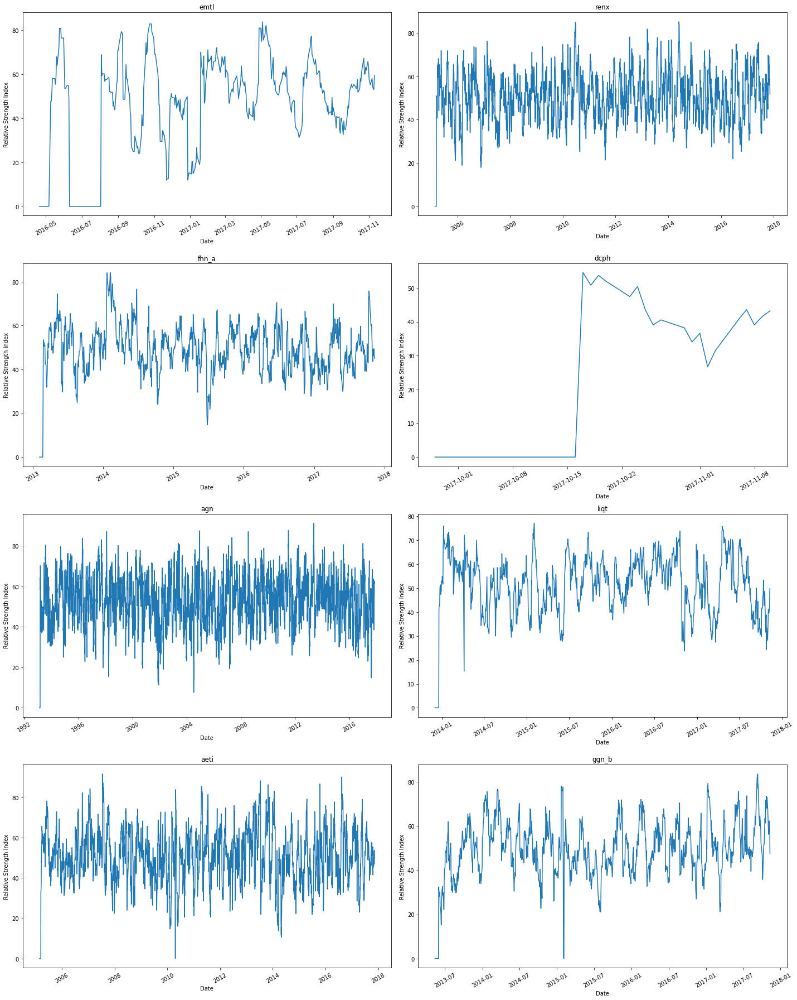

In [ ]:
%matplotlib inline

# RSI Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['RSI_14D'])
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Relative Strength Index")
    plt.xticks(rotation=30)
fig.tight_layout()


# Visualization of technical indicators

In [ ]:
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2014-09-30,22.540,22.549,22.522,22.54900,2275,0,heem,0.0,2275,...,0.0,0.0,0.0,0.0,0.0,21.958414,0.0,0.0,0.0,0.0
1,2014-10-01,22.361,22.361,22.345,22.34500,321,0,heem,0.0,321,...,0.0,0.0,0.0,0.0,0.0,21.978085,0.0,0.0,0.0,0.0
2,2014-10-02,22.044,22.053,22.015,22.54900,535,0,heem,0.0,535,...,0.0,0.0,0.0,0.0,0.0,22.032002,0.0,0.0,0.0,0.0
3,2014-10-03,22.438,22.474,22.390,22.53832,25532,0,heem,0.0,25532,...,0.0,0.0,0.0,0.0,0.0,22.083762,0.0,0.0,0.0,0.0
4,2014-10-06,22.924,22.924,22.784,22.01500,17552,0,heem,0.0,17552,...,0.0,0.0,0.0,0.0,0.0,22.133452,0.0,0.0,0.0,0.0


In [ ]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock].index = TechIndicator[stock]['Date']
    TechIndicator[stock] = TechIndicator[stock].drop(labels = ['Date'], axis = 1)


In [ ]:
TechIndicator[0].head()

,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
Date,,,,,,,,,,,,,,,,,,,,,
2014-09-30,22.540,22.549,22.522,22.54900,2275,0,heem,0.0,2275,0.0,...,0.0,0.0,0.0,0.0,0.0,21.958414,0.0,0.0,0.0,0.0
2014-10-01,22.361,22.361,22.345,22.34500,321,0,heem,0.0,321,0.0,...,0.0,0.0,0.0,0.0,0.0,21.978085,0.0,0.0,0.0,0.0
2014-10-02,22.044,22.053,22.015,22.54900,535,0,heem,0.0,535,0.0,...,0.0,0.0,0.0,0.0,0.0,22.032002,0.0,0.0,0.0,0.0
2014-10-03,22.438,22.474,22.390,22.53832,25532,0,heem,0.0,25532,0.0,...,0.0,0.0,0.0,0.0,0.0,22.083762,0.0,0.0,0.0,0.0
2014-10-06,22.924,22.924,22.784,22.01500,17552,0,heem,0.0,17552,0.0,...,0.0,0.0,0.0,0.0,0.0,22.133452,0.0,0.0,0.0,0.0


In [ ]:
TechIndicator[0].index

DatetimeIndex(['2014-09-30', '2014-10-01', '2014-10-02', '2014-10-03',
               '2014-10-06', '2014-10-07', '2014-10-08', '2014-10-15',
               '2014-10-16', '2014-10-17',
               ...
               '2017-10-30', '2017-10-31', '2017-11-01', '2017-11-02',
               '2017-11-03', '2017-11-06', '2017-11-07', '2017-11-08',
               '2017-11-09', '2017-11-10'],
              dtype='datetime64[ns]', name='Date', length=769, freq=None)

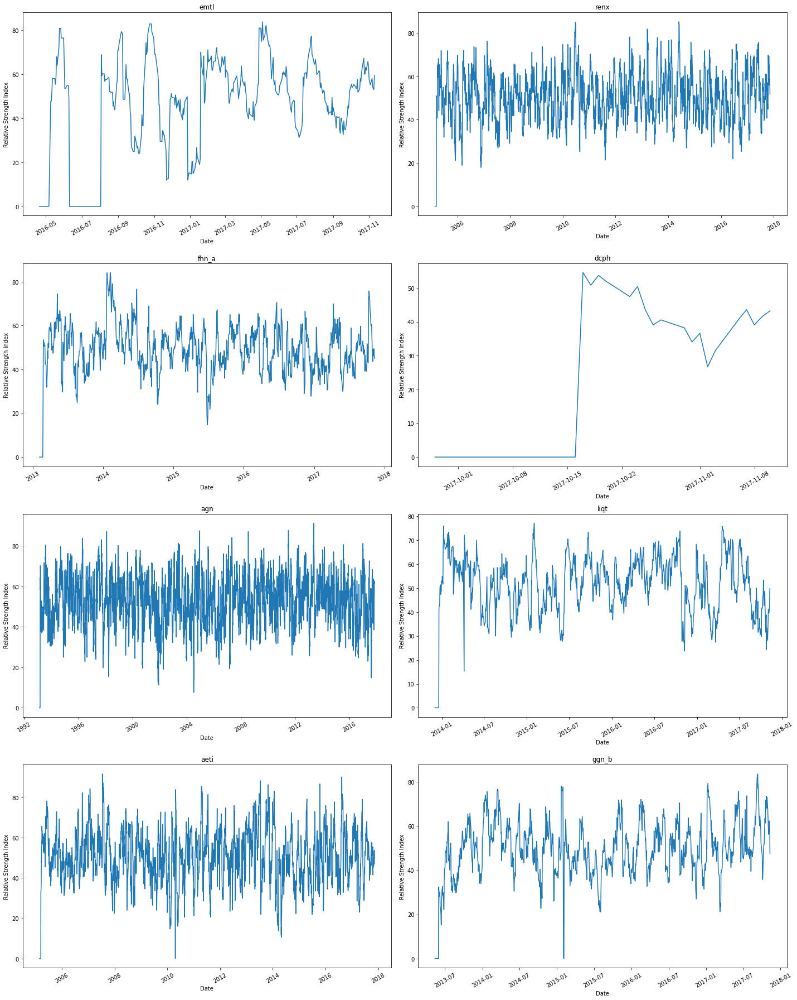

In [ ]:
%matplotlib inline

# RSI Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['RSI_14D'])
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Relative Strength Index")
    plt.xticks(rotation=30)
fig.tight_layout()


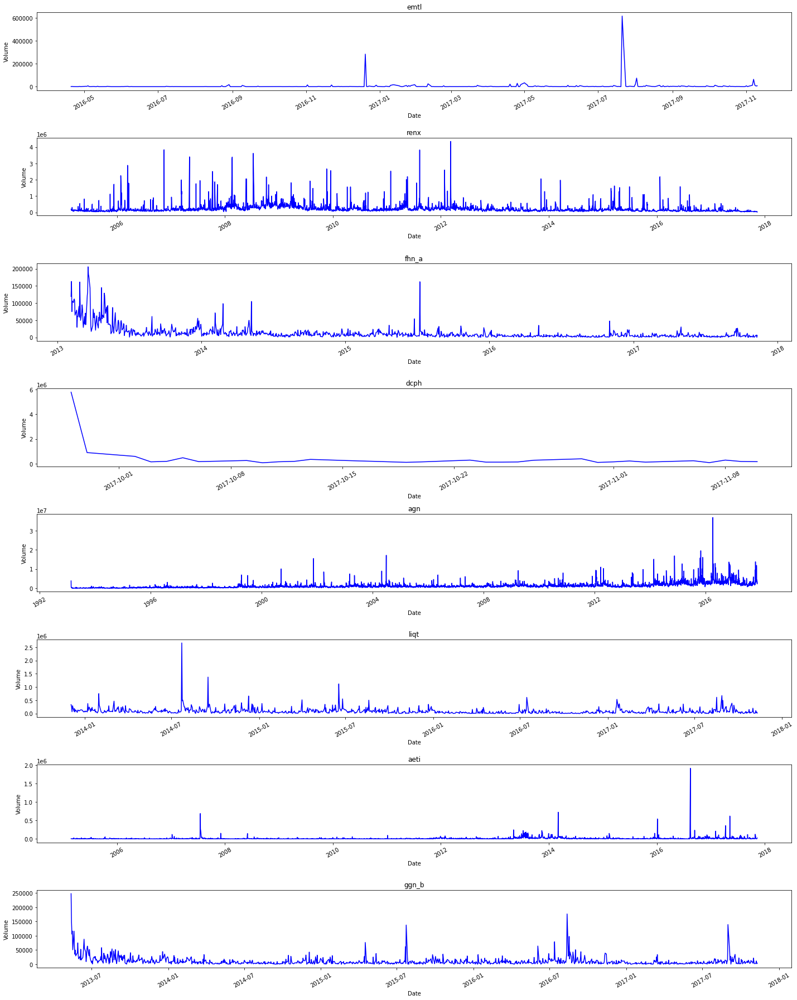

In [ ]:
# Volume Plain plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume_plain'], 'b')
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Volume")
    plt.xticks(rotation=30)
fig.tight_layout()

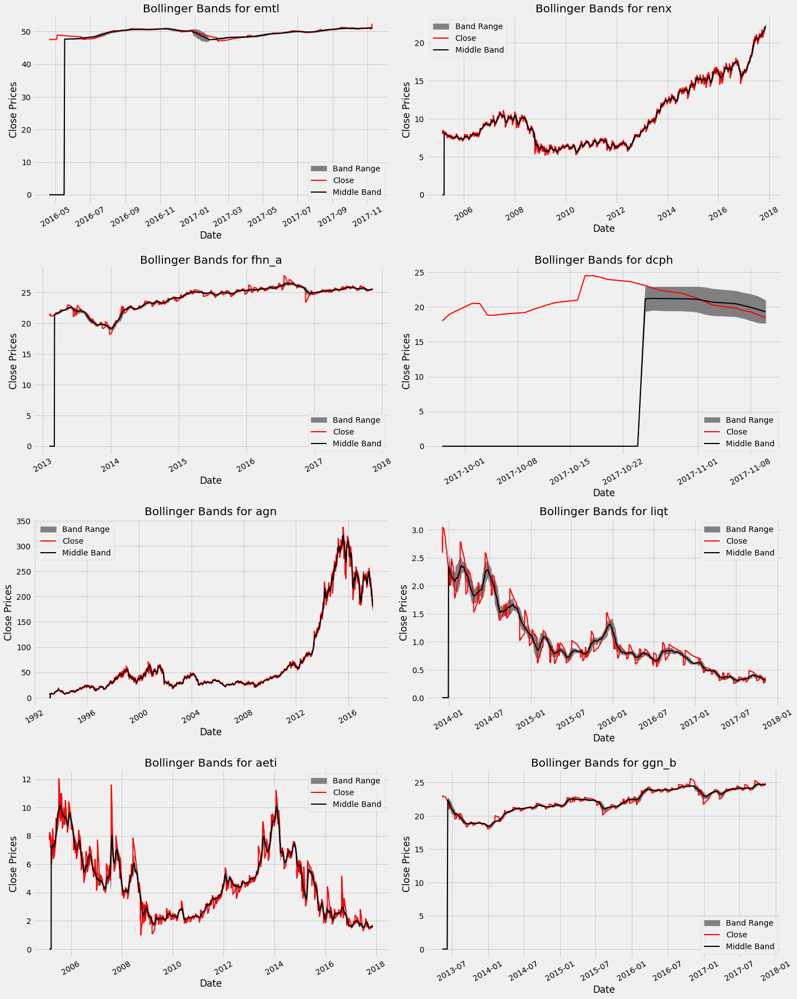

In [ ]:
plt.style.use('fivethirtyeight')

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['BB_Upper_Band'], TechIndicator[i]['BB_Lower_Band'], color='grey', label="Band Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label="Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['BB_Middle_Band'], color='black', lw=2, label="Middle Band")
    ax.set_title("Bollinger Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()
#.dt.to_pydatetime()

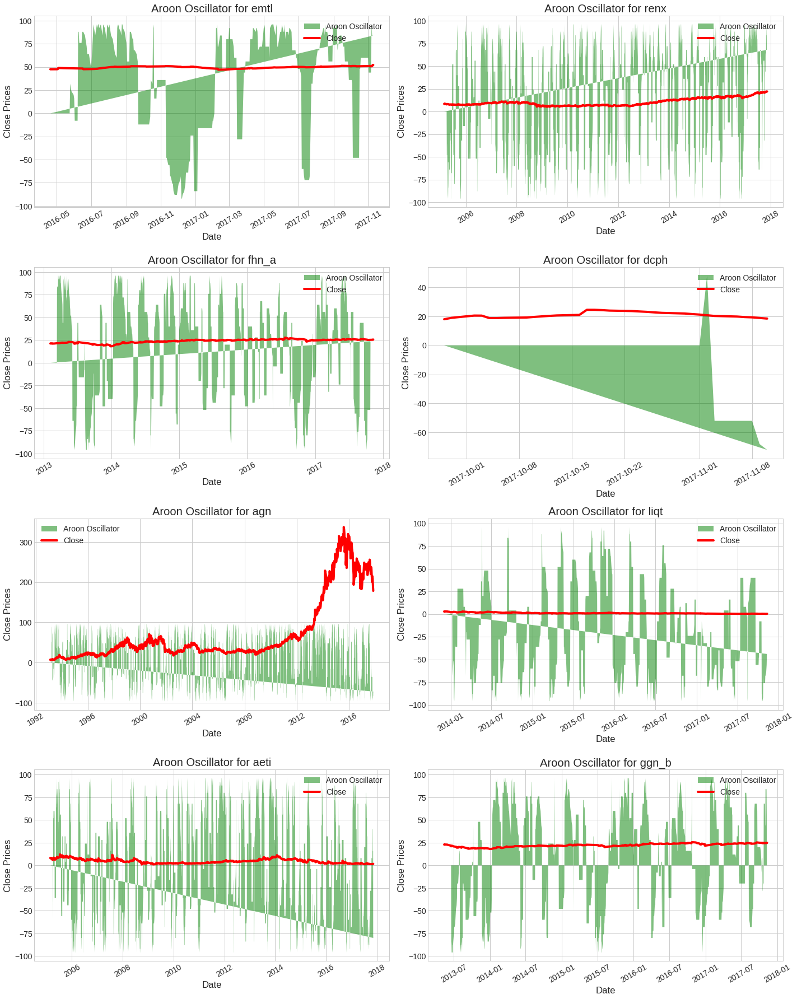

In [ ]:
# Aroon Oscillator Plot
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill(TechIndicator[i].index, TechIndicator[i]['Aroon_Oscillator'],'g', alpha = 0.5, label = "Aroon Oscillator")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
    ax.set_title("Aroon Oscillator for " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

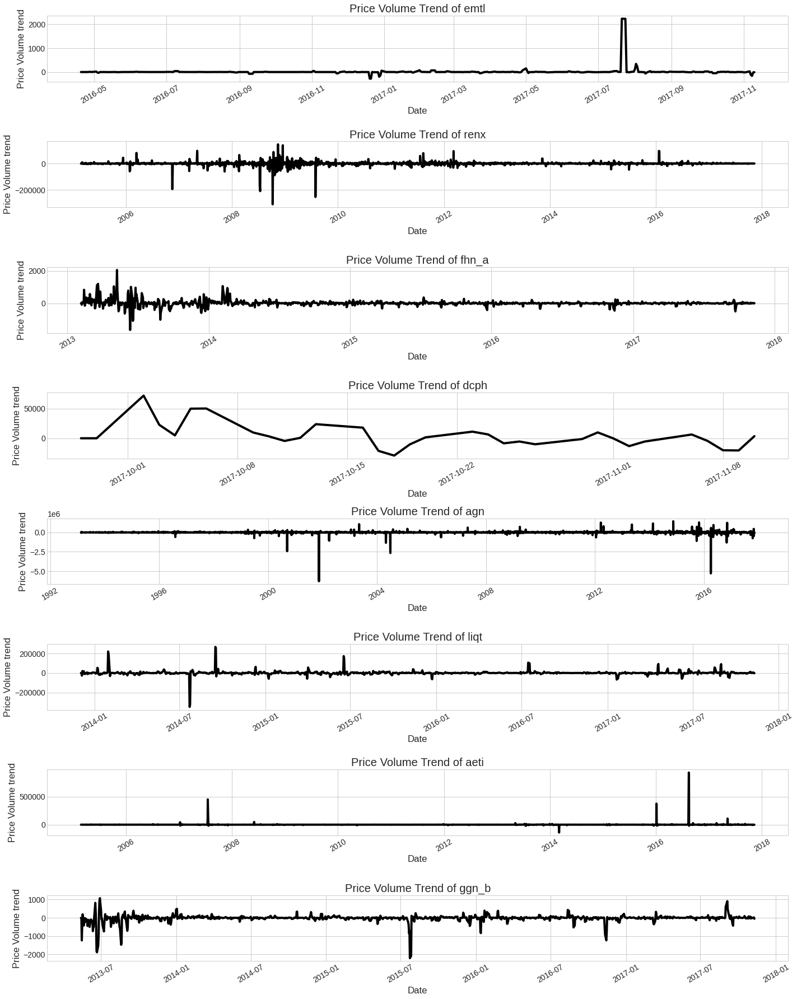

In [ ]:
# PRice Volume Trend Plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['PVT'], 'black')
    ax.set_title("Price Volume Trend of " +str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Price Volume trend")
    plt.xticks(rotation=30)
fig.tight_layout()

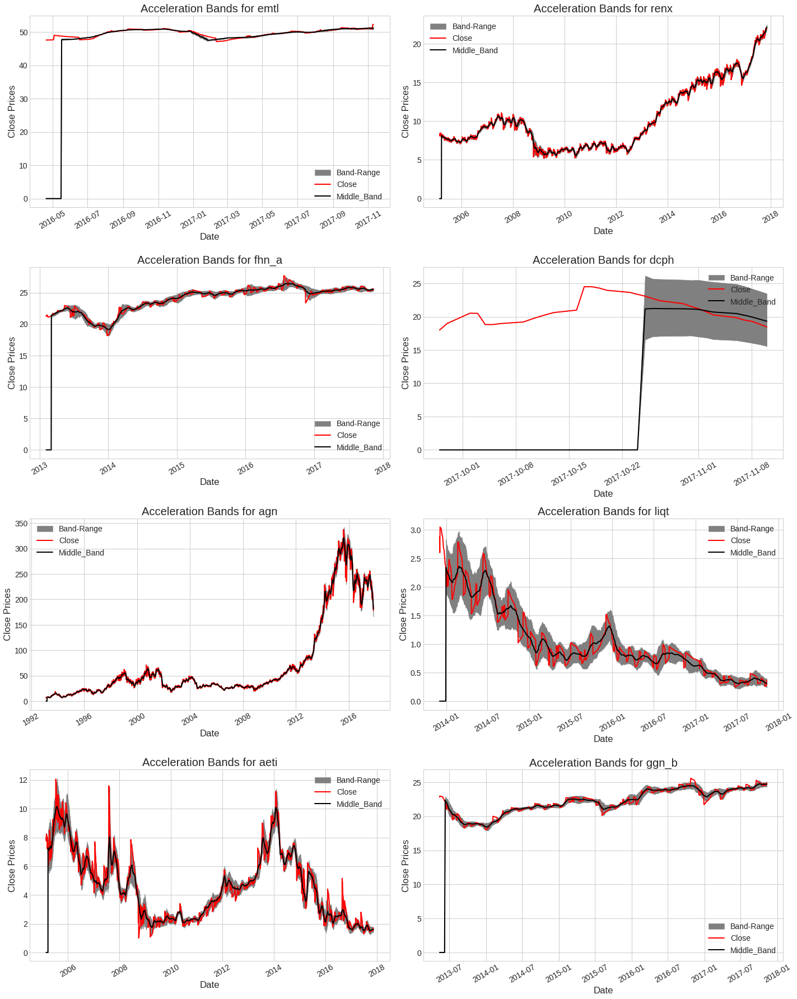

In [ ]:
# Acceleration band Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['AB_Upper_Band'], TechIndicator[i]['AB_Lower_Band'], color='grey', label = "Band-Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label = "Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['AB_Middle_Band'], color='black', lw=2, label="Middle_Band")
    ax.set_title("Acceleration Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

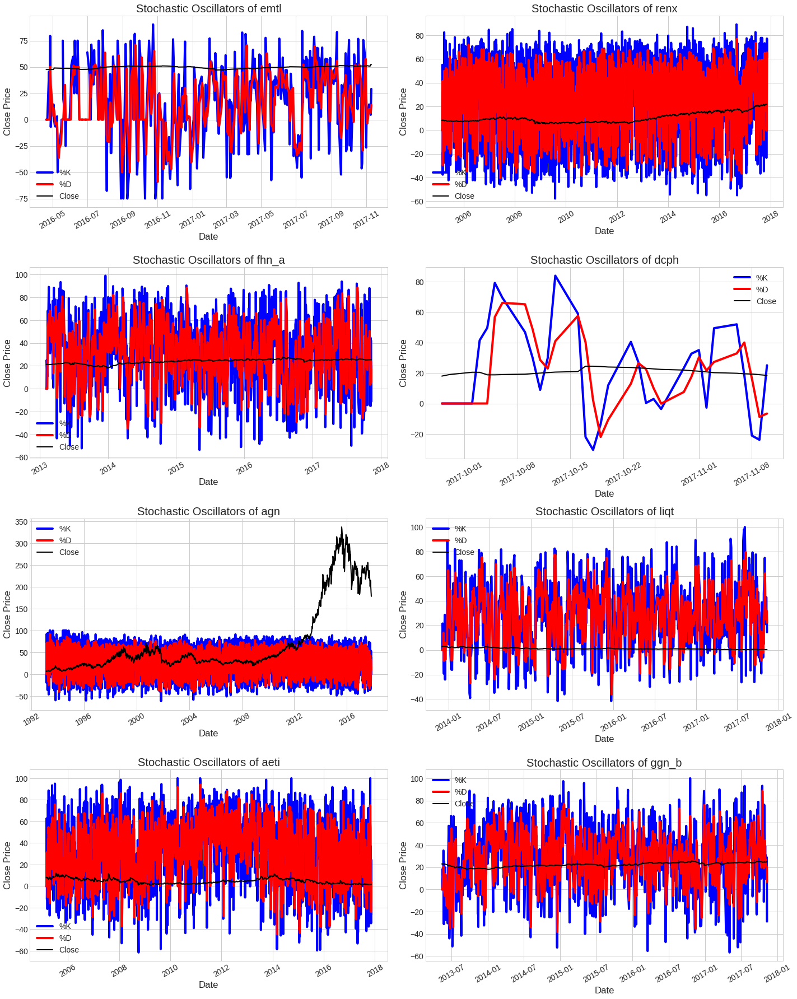

In [ ]:
# Stochastic Oscillator plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOK'], 'blue', label="%K")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOD'], 'red', label="%D")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='black', lw=2, label = "Close")
    ax.set_title("Stochastic Oscillators of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

<ipython-input-73-53f45356a588>:24: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



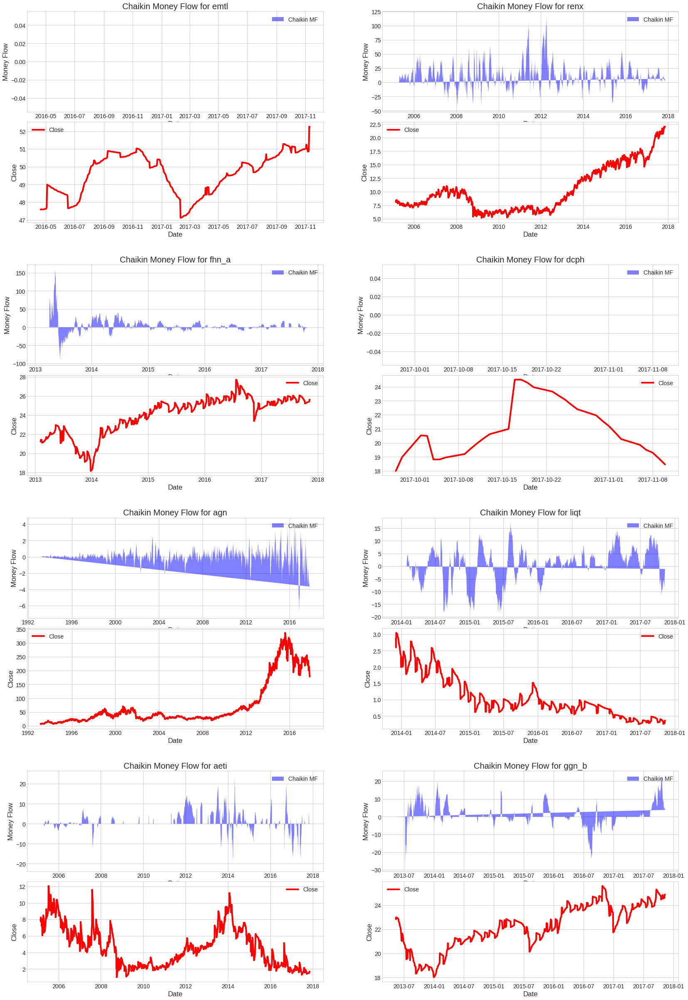

In [ ]:
# Chaikin Money Flow Plots
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(25,40))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)

    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.fill(TechIndicator[i].index, TechIndicator[i]['Chaikin_MF'],'b', alpha = 0.5, label = "Chaikin MF")
            ax.set_title("Chaikin Money Flow for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Money Flow")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
            t = ax.set_ylabel("Close")
        ax.legend()
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

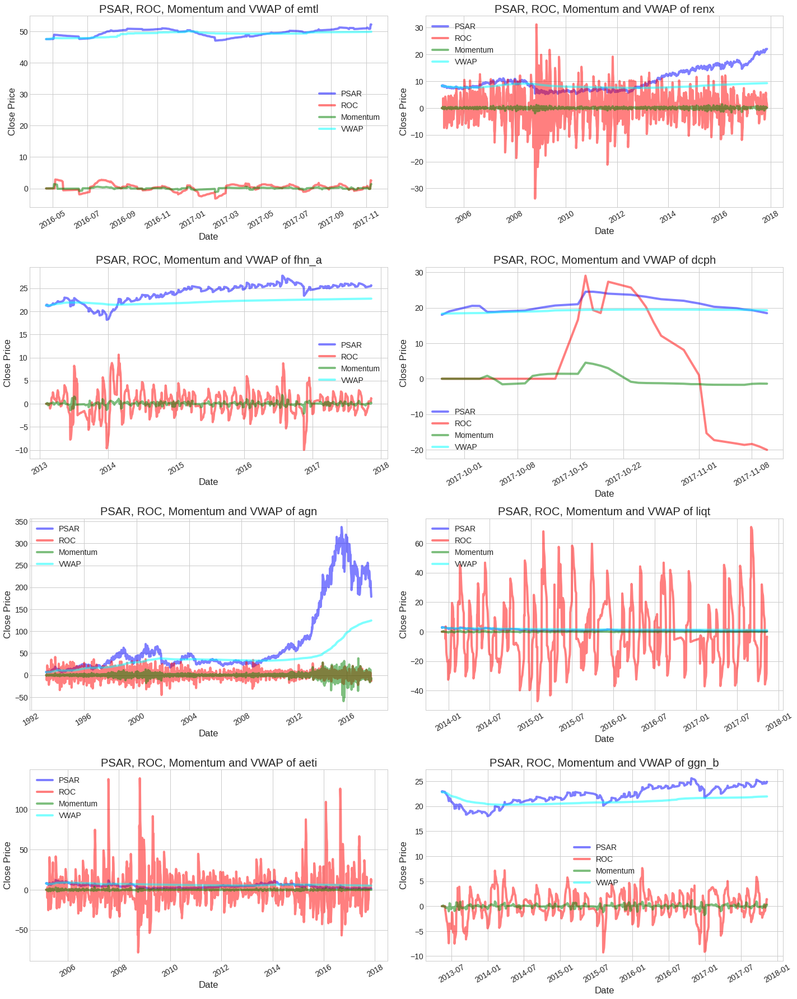

In [ ]:
# Parabolic SAR, Rate of Change, Momentum and VWAP Plots
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['psar'], 'blue', label="PSAR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ROC'], 'red', label="ROC", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Momentum'], 'green', label="Momentum", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['VWAP'], 'cyan', label="VWAP", alpha = 0.5)
    ax.set_title("PSAR, ROC, Momentum and VWAP of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

<ipython-input-75-13ba31de2d26>:29: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



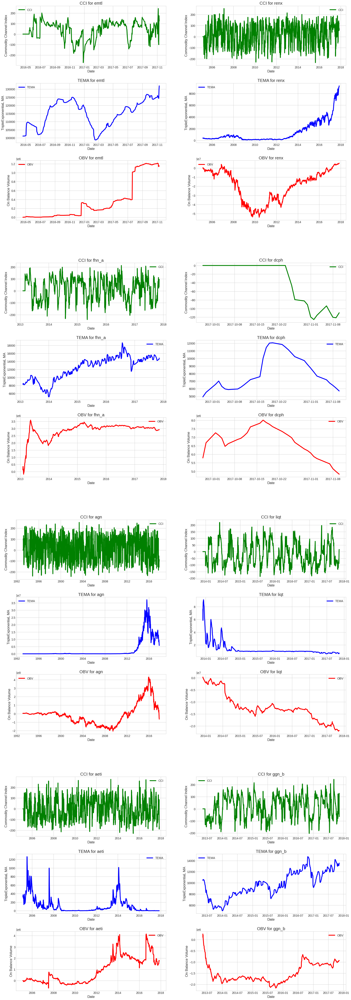

In [ ]:
# Commodity Channel Index, Triple Exponential Moving Average On Banalance Volume Plots

fig = plt.figure(figsize=(25,80))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.3, hspace=0.3)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['CCI'], 'green', label="CCI")
            t = ax.set_title("CCI for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Commodity Channel Index")
        elif j == 1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['TEMA'], 'blue', label="TEMA")
            t = ax.set_title("TEMA for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("TripleExponentiaL MA")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['OBV'], 'red', label="OBV")
            t = ax.set_title("OBV for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("On Balance Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

In [ ]:
# Normalized Average True range Plots
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['NATR'], 'red', label="NATR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'cyan', label="Close", alpha = 0.5)
    ax.set_title("NATR of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

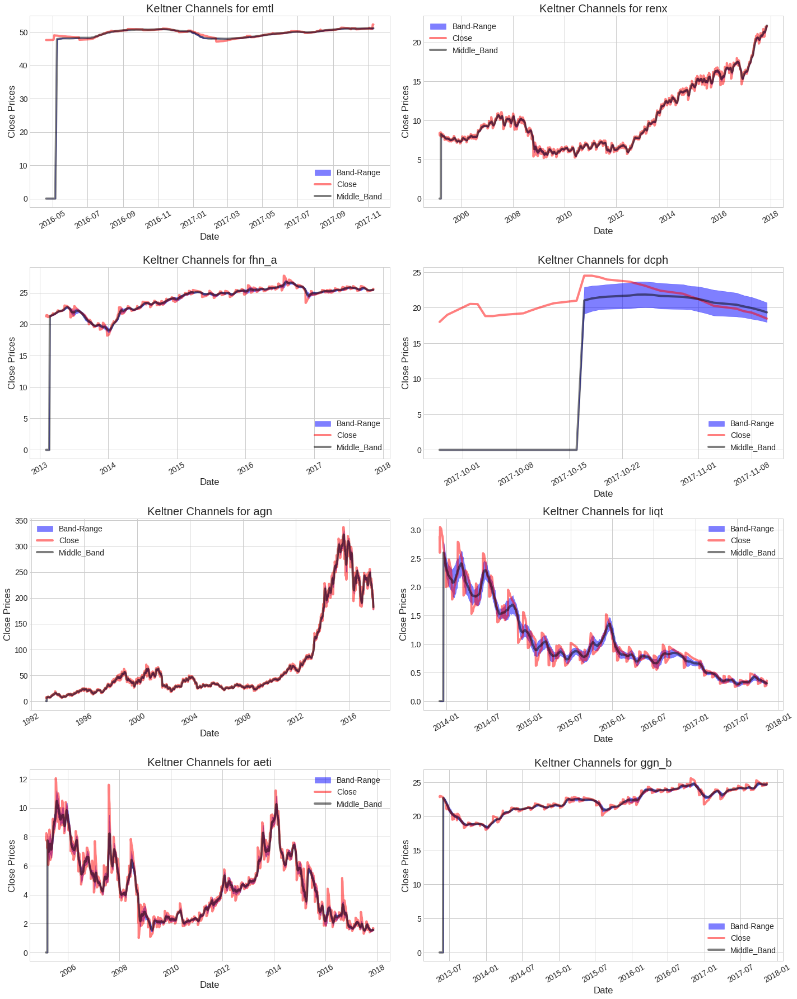

In [ ]:
# Keltner Channels Plots

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['Kelch_Upper'], TechIndicator[i]['Kelch_Down'], 
                    color='blue', label = "Band-Range", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', label = "Close", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Kelch_Middle'], color='black', label="Middle_Band", alpha = 0.5)
    ax.set_title("Keltner Channels for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

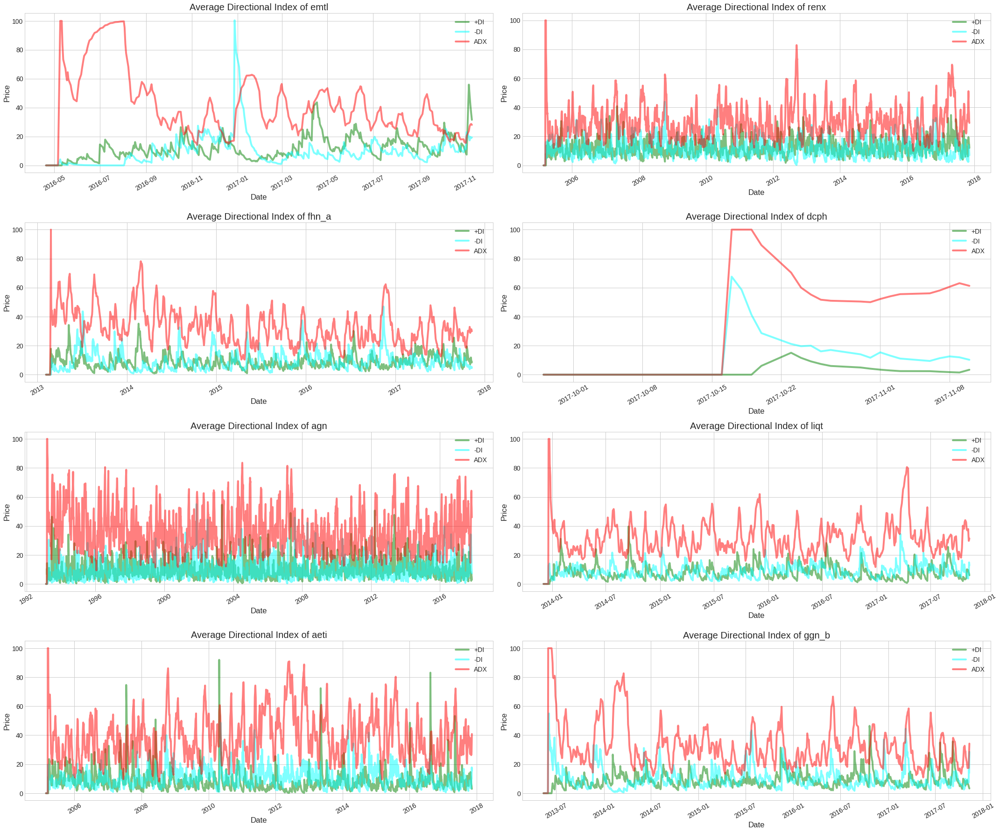

In [ ]:
# Average Directional Index

plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(30,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['plusDI'], 'green', label="+DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['minusDI'], 'cyan', label="-DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ADX'], 'red', label="ADX", alpha = 0.5)
    ax.set_title("Average Directional Index of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

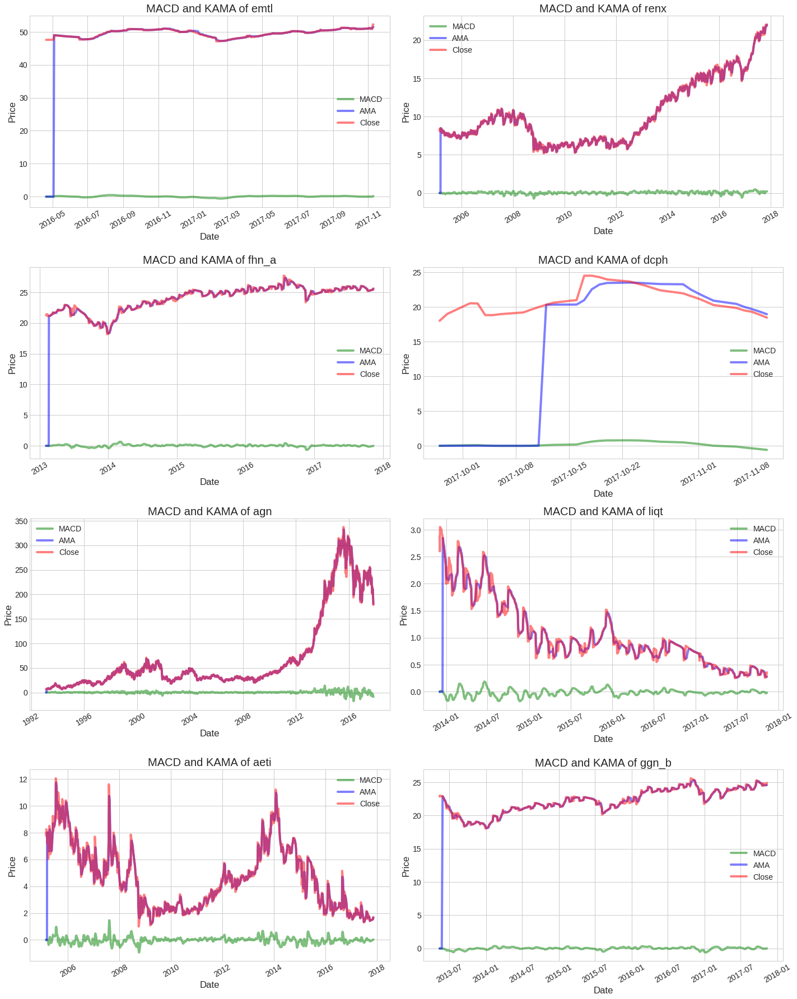

In [ ]:
# Moving Average Convergence Divergence, Adaptive Moving Avergae Plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['MACD'], 'green', label="MACD", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['KAMA'], 'blue', label="AMA", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'red', label="Close", alpha = 0.5)
    ax.set_title("MACD and KAMA of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

<ipython-input-79-7683a48bb72f>:31: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



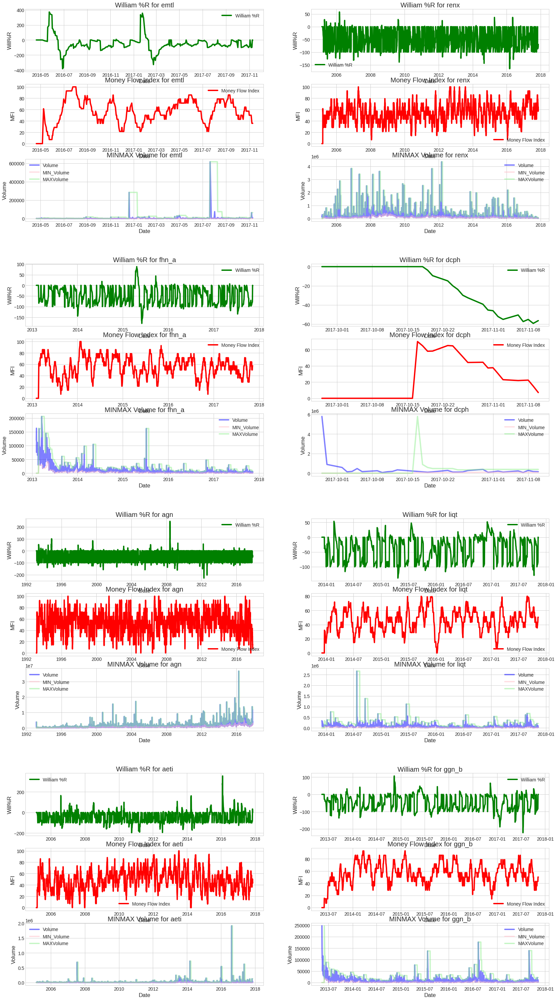

In [ ]:
# William %R, Money Flow
fig = plt.figure(figsize=(25,50))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.2, hspace=0.2)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['WillR'], 'green', label="William %R")
            t = ax.set_title("William %R for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Will%R")
        elif j ==1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Money_Flow_Index'], 'red', label="Money Flow Index")
            
            t = ax.set_title("Money Flow Index for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("MFI")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume'], 'blue', label="Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MIN_Volume'], 'pink', label="MIN_Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MAX_Volume'], 'lightgreen', label="MAXVolume",  alpha = 0.5)
            t = ax.set_title("MINMAX Volume for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

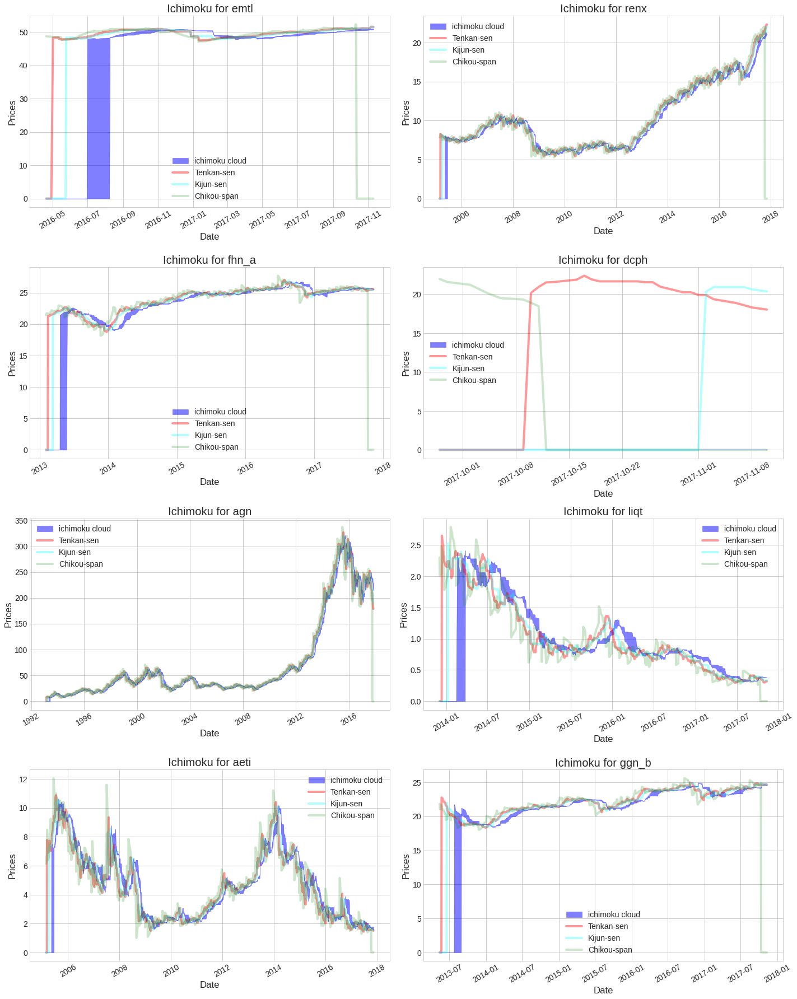

In [ ]:
# ichimoku Plots turning_line	standard_line	ichimoku_span1	ichimoku_span2	chikou_span

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['ichimoku_span1'], TechIndicator[i]['ichimoku_span2'], 
                    color='blue', label = "ichimoku cloud", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['turning_line'], color='red', label = "Tenkan-sen", alpha = 0.4)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['standard_line'], color='cyan', label="Kijun-sen", alpha = 0.3)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['chikou_span'], color='green', label="Chikou-span", alpha = 0.2)
    ax.set_title("Ichimoku for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

I have also tried prediction of movement of stock market based on this data. You can refer to that kernel here: https://www.kaggle.com/kratisaxena/lstm-gru-models-for-stock-movement-analysis